In [1]:
# Enable outputting results interactively. 
# All the results from code in a given cell will be displayed instead of only the last one.

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:

import plotly.plotly as py
import plotly.graph_objs as go
# from plotly.offline import iplot, init_notebook_mode
import plotly
# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


# import plotly.figure_factory as ff

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
# init_notebook_mode(connected=True)

In [3]:
import folium

from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

import geopandas as gpd
import json

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [5]:
import pandas as pd
import pickle
import numpy as np
import scipy.stats as stats
import sqlite3
import math
import datetime

In [6]:
listings =  pickle.load( open( "../all_SF_listings.p", "rb" ) )

In [7]:
# Filter to listings of which the min. nights is less than 30 days. Rentals of 30 days and above are not subject to the new regulations.


listings.shape
listings = listings[listings['minimum_nights']<30]
listings.shape

(334790, 107)

(288215, 107)

In [8]:
288215/334790

0.8608829415454464

In [9]:
reviews =  pickle.load( open( "../all_SF_reviews.p", "rb" ) )
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,958,5977,2009-07-23,15695,Edmund C,"Our experience was, without a doubt, a five st..."
1,958,6660,2009-08-03,26145,Simon,Returning to San Francisco is a rejuvenating t...
2,958,11519,2009-09-27,25839,Denis,We were very pleased with the accommodations a...
3,958,16282,2009-11-05,33750,Anna,We highly recommend this accomodation and agre...
4,958,26008,2010-02-13,15416,Venetia,Holly's place was great. It was exactly what I...


In [10]:
listings_t = listings.set_index(pd.DatetimeIndex(listings['file_scraped_dt']))
listings_t.shape

# del listings_t['file_scraped_dt']
listings_t.head()

(288215, 107)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,958,https://www.airbnb.com/rooms/958,20190503153007,2019-05-03,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,...,f,moderate,f,f,1,1.0,0.0,0.0,1.55,2019-05-03
2019-05-03,8339,https://www.airbnb.com/rooms/8339,20190503153007,2019-05-03,Historic Alamo Square Victorian,Pls email before booking. Interior featured i...,Please send us a quick message before booking ...,Pls email before booking. Interior featured i...,none,NaN,...,f,strict_14_with_grace_period,t,t,2,2.0,0.0,0.0,0.23,2019-05-03
2019-05-03,8567,https://www.airbnb.com/rooms/8567,20190503153007,2019-05-03,Lovely 2BR flat Great Location,NaN,"Fully furnished 2BR, 1BA flat in beautiful Vic...","Fully furnished 2BR, 1BA flat in beautiful Vic...",none,"The neighborhood is very centrally located, cl...",...,f,moderate,f,f,1,1.0,0.0,0.0,0.27,2019-05-03
2019-05-03,8739,https://www.airbnb.com/rooms/8739,20190503153007,2019-05-03,"Mission Sunshine, with Private Bath","Welcome to ""The Mission,"" the sunniest neighbo...","Your sunny room looks out over a lush garden, ...","Welcome to ""The Mission,"" the sunniest neighbo...",none,Located between Valencia Street and Dolores Pa...,...,f,strict_14_with_grace_period,f,f,2,0.0,2.0,0.0,5.60,2019-05-03
2019-05-03,9225,https://www.airbnb.com/rooms/9225,20190503153007,2019-05-03,Artful Potrero Separate Floor with Garden,A Unique Guest Suite! A Spacious Art Filled ...,"It is unique, very spacious [800 sq. ft. with...",A Unique Guest Suite! A Spacious Art Filled ...,none,"It is a distinct neighborhood, with easy acces...",...,f,strict_14_with_grace_period,f,f,1,0.0,1.0,0.0,4.02,2019-05-03


In [11]:
m_ls = listings_t.resample('D').size().reset_index(name='Counts') 
m_ls

,file_scraped_dt,Counts
0,2015-05-04,5280
1,2015-05-05,0
2,2015-05-06,0
3,2015-05-07,0
4,2015-05-08,0
5,2015-05-09,0
6,2015-05-10,0
7,2015-05-11,0
8,2015-05-12,0
9,2015-05-13,0


(0, 9500)

Text(0.5, 0, 'Month')

Text(0, 0.5, 'Number of Active Short-term Rental Listings')

Text(0.5, 1.0, 'Number of Active Short-term Rental Listings on Airbnb: May 2015 - May 2019')

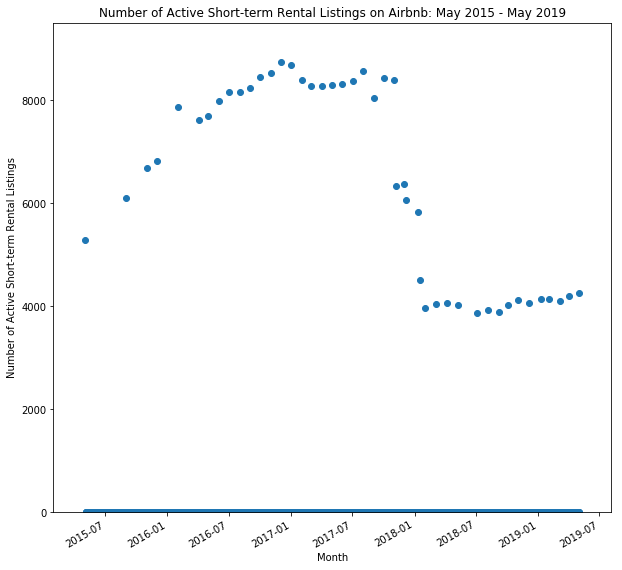

In [12]:
import matplotlib.dates as mdates

xlinspace = pd.date_range('2015-05-04', periods=1461, freq='D')

fig, ax = plt.subplots(1,figsize = (10,10))
fig.autofmt_xdate()
plt.scatter(xlinspace,m_ls['Counts'])
ax.set_ylim(0,9500)
plt.xlabel("Month")
plt.ylabel("Number of Active Short-term Rental Listings")
plt.title("Number of Active Short-term Rental Listings on Airbnb: May 2015 - May 2019")

xfmt = mdates.DateFormatter('%m-%d-%y')
# ax.xaxis.set_major_formatter(xfmt)

plt.show()

In [13]:
# pd.crosstab(listings['id'],listings['file_scraped_dt'],margins=True)

In [14]:
f = lambda x: 'BED & BREAKFAST' if x == 'BED AND BREAKFAST' else x

listings['property_type_c'] = listings['property_type'].str.upper().map(f)

In [15]:
sub = listings[['file_scraped_dt','id','host_since','host_id','property_type_c', 'room_type', 'minimum_nights', 'neighbourhood', 'review_scores_rating', 'review_scores_accuracy','review_scores_communication','review_scores_cleanliness','review_scores_location','review_scores_checkin','review_scores_value']]
sub.shape

(288215, 15)

In [16]:
conn = sqlite3.connect("airbnb.db")
sub.to_sql('listings_shortterm_db', conn, if_exists='replace')

In [17]:
reviews.to_sql('reviews', conn, if_exists='replace')

In [18]:
ls_reviews = pd.read_sql_query(
    'select listing_id, min(date) as first_review_dt,max(date) as last_review_dt, count(*) as count_reviews from reviews group by listing_id order by count_reviews desc;' ,conn)

ls_reviews['reviews_history_month'] = (pd.to_datetime(ls_reviews['last_review_dt']) - pd.to_datetime(ls_reviews['first_review_dt']))/np.timedelta64(1, 'M')

ls_reviews.head()


,listing_id,first_review_dt,last_review_dt,count_reviews,reviews_history_month
0,545685,2012-06-28,2019-04-28,731,81.972936
1,8739,2009-08-01,2019-04-30,708,116.930532
2,205842,2012-07-22,2019-01-01,674,77.340397
3,1920033,2013-11-22,2019-05-01,660,65.249800
4,585326,2012-07-14,2019-04-27,652,81.414403


In [19]:
ls_reviews['reviews_history_month'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Booking History of a Listing <br> Months Difference between the First Review Date and the Last Review Date')

In [20]:
ls_reviews['count_reviews'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Number of Reviews',
    yTitle='(%) of Listings',
    title='Number of Reviews for a Listing')

In [21]:
plus5_reviews = ls_reviews[ls_reviews['count_reviews']>= 5]

plus5_reviews['count_reviews'].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Number of Reviews',
    yTitle='(%) of Listings',
    title='Number of Reviews for a Listing <br> Listing with a minimum of 5 reviews')

In [22]:
ls_reviews.to_sql('ls_reviews', conn, if_exists='replace')

In [23]:
tab1 = pd.read_sql_query(
    'select id as listing_id, property_type_c, room_type, host_since, min(minimum_nights) as min_min_nights, max(minimum_nights) as max_min_nights, min(file_scraped_dt) as first_scraped_dt, max(file_scraped_dt) as last_scraped_dt from listings_shortterm_db group by id;' ,conn)
tab1.head()

tab1.shape


,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt
0,958,APARTMENT,Entire home/apt,2008-07-31,1,2,2015-05-04,2019-05-03
1,2822,HOUSE,Private room,2008-09-24,1,1,2015-09-02,2016-06-02
2,3850,HOUSE,Private room,2008-12-08,1,1,2015-05-04,2015-05-04
3,5021,APARTMENT,Entire home/apt,2009-01-29,1,1,2016-12-03,2018-01-17
4,5193,APARTMENT,Entire home/apt,2009-02-05,1,1,2015-05-04,2016-12-03


(26335, 8)

In [24]:
tab1.to_sql('ls_dt_range', conn, if_exists='replace')


In [25]:
test = pd.read_sql_query(
    'select *, (max_min_nights - min_min_nights) as diff_min_nights from ls_dt_range order by diff_min_nights desc;',conn)
test.head()

,index,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt,diff_min_nights
0,145,52713,APARTMENT,Private room,2010-09-24,1,29,2015-05-04,2017-08-02,28
1,430,231752,APARTMENT,Entire home/apt,2011-06-12,1,29,2015-09-02,2017-08-02,28
2,645,357862,LOFT,Entire home/apt,2010-10-21,1,29,2015-05-04,2017-09-02,28
3,835,496226,APARTMENT,Entire home/apt,2012-05-23,1,29,2015-05-04,2017-12-02,28
4,1588,948066,APARTMENT,Entire home/apt,2012-07-09,1,29,2015-09-02,2017-09-02,28


In [26]:
ls_tab = pd.read_sql_query(
    'select a.*, b.first_review_dt, b.last_review_dt, b.count_reviews, b.reviews_history_month from ls_dt_range as a left join ls_reviews as b on a.listing_id = b.listing_id',conn)

ls_tab.head()

,index,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month
0,0,958,APARTMENT,Entire home/apt,2008-07-31,1,2,2015-05-04,2019-05-03,2009-07-23,2019-04-17,192.0,116.799113
1,1,2822,HOUSE,Private room,2008-09-24,1,1,2015-09-02,2016-06-02,2010-07-25,2016-05-08,55.0,69.455225
2,2,3850,HOUSE,Private room,2008-12-08,1,1,2015-05-04,2015-05-04,2009-07-16,2015-01-01,120.0,65.545494
3,3,5021,APARTMENT,Entire home/apt,2009-01-29,1,1,2016-12-03,2018-01-17,2011-07-04,2017-12-31,6.0,77.931785
4,4,5193,APARTMENT,Entire home/apt,2009-02-05,1,1,2015-05-04,2016-12-03,2009-09-29,2016-12-20,309.0,86.704039


In [27]:

ls_tab['listing_month_diff'] = (pd.to_datetime(ls_tab['last_scraped_dt']) - pd.to_datetime(ls_tab['first_review_dt']))/np.timedelta64(1, 'M')
ls_tab['listing_day_diff'] = (pd.to_datetime(ls_tab['last_scraped_dt']) - pd.to_datetime(ls_tab['first_review_dt'])).dt.days


ls_tab['review_month_diff'] = (pd.to_datetime(ls_tab['last_review_dt']) - pd.to_datetime(ls_tab['first_review_dt']))/np.timedelta64(1, 'M')
ls_tab['review_day_diff'] = (pd.to_datetime(ls_tab['last_review_dt']) - pd.to_datetime(ls_tab['first_review_dt'])).dt.days

test = ls_tab[ls_tab['listing_day_diff']<0]
test.shape

# The listing_day_diff is negative in 139 listings.Remove them for now. Should investigate later.
ls_tab = ls_tab[ls_tab['listing_day_diff'] >=0]
ls_tab.shape


(139, 17)

(19456, 17)

In [28]:
# ls_tab.sort_values(by='listing_month_diff')

In [29]:
no_reviews = ls_tab[ls_tab['first_review_dt'].isnull()]
no_reviews.head()

no_reviews.shape

#8514 listings have no reviews. 

,index,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff


(0, 17)

In [30]:
ls_w_reviews = ls_tab[pd.notna(ls_tab['first_review_dt'])]
ls_w_reviews.shape

(19456, 17)

In [31]:
# the chart excludes listings with no reviews.

ls_w_reviews[['listing_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Longevity of a Listing <br> Months Difference between the First Review Date and the Last Scraped Date')

In [32]:
# the chart includes listings with no reviews.

ls_tab[['listing_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='(%) of Listings',
    title='Longevity of a Listing <br> Months Difference between the First Review Date and the Last Scraped Date')

In [33]:
scores = pd.read_sql_query(
    'select id as listing_id, avg(review_scores_rating) as overall_scores, avg(review_scores_accuracy) as accuracy_scores,avg(review_scores_communication) as communication_scores,avg(review_scores_cleanliness) as cleaniness_scores,avg(review_scores_location) as location_scores,avg(review_scores_checkin) as checkin_scores,avg(review_scores_value) as value_scores from listings_shortterm_db group by listing_id order by overall_scores desc;',conn)

scores.head()




,listing_id,overall_scores,accuracy_scores,communication_scores,cleaniness_scores,location_scores,checkin_scores,value_scores
0,11009,100.0,10.0,10.0,10.0,10.0,10.0,10.0
1,16428,100.0,9.0,10.0,10.0,10.0,10.0,10.0
2,24849,100.0,10.0,10.0,10.0,10.0,10.0,10.0
3,25691,100.0,10.0,10.0,10.0,10.0,10.0,10.0
4,33180,100.0,10.0,10.0,10.0,10.0,10.0,10.0


In [34]:
scores.to_sql('scores_db', conn, if_exists='replace')

In [35]:
ls_tab.to_sql('ls_tab_db', conn, if_exists='replace')

ls_tab2 = pd.read_sql_query(
    'select a.*, b.overall_scores, b.accuracy_scores, b.communication_scores, b.cleaniness_scores, b.location_scores, b.checkin_scores,b.value_scores from ls_tab_db as a left join scores_db as b on a.listing_id = b.listing_id',conn)

ls_tab2.head()

,level_0,index,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt,...,listing_day_diff,review_month_diff,review_day_diff,overall_scores,accuracy_scores,communication_scores,cleaniness_scores,location_scores,checkin_scores,value_scores
0,0,0,958,APARTMENT,Entire home/apt,2008-07-31,1,2,2015-05-04,2019-05-03,...,3571.0,116.799113,3555.0,97.022222,10.0,10.0,10.000000,10.000000,10.0,9.866667
1,1,1,2822,HOUSE,Private room,2008-09-24,1,1,2015-09-02,2016-06-02,...,2139.0,69.455225,2114.0,98.000000,10.0,10.0,10.000000,9.000000,10.0,10.000000
2,2,2,3850,HOUSE,Private room,2008-12-08,1,1,2015-05-04,2015-05-04,...,2118.0,65.545494,1995.0,93.000000,9.0,10.0,9.000000,9.000000,10.0,9.000000
3,3,3,5021,APARTMENT,Entire home/apt,2009-01-29,1,1,2016-12-03,2018-01-17,...,2389.0,77.931785,2372.0,90.666667,9.0,10.0,9.000000,10.000000,10.0,8.000000
4,4,4,5193,APARTMENT,Entire home/apt,2009-02-05,1,1,2015-05-04,2016-12-03,...,2622.0,86.704039,2639.0,92.785714,9.0,10.0,9.714286,9.928571,10.0,9.000000


In [36]:
ls_tab2.columns

Index(['level_0', 'index', 'listing_id', 'property_type_c', 'room_type',
       'host_since', 'min_min_nights', 'max_min_nights', 'first_scraped_dt',
       'last_scraped_dt', 'first_review_dt', 'last_review_dt', 'count_reviews',
       'reviews_history_month', 'listing_month_diff', 'listing_day_diff',
       'review_month_diff', 'review_day_diff', 'overall_scores',
       'accuracy_scores', 'communication_scores', 'cleaniness_scores',
       'location_scores', 'checkin_scores', 'value_scores'],
      dtype='object')

In [37]:
ls_tab2.drop(['level_0'], axis = 1).to_sql('listings_scores_db', conn, if_exists='replace')

In [38]:
# Relationship between longevity of a listing and scores

trace = go.Scatter(
    x = ls_tab2['overall_scores'],
    y = ls_tab2['listing_month_diff'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Overall Review Scores vs Longevity of a Listing',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Average Review Scores',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Longevty of a Listing',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [39]:
# Relationship between number of reviews and length of booking history


trace = go.Scatter(
    x = ls_reviews['reviews_history_month'],
    y = ls_reviews['count_reviews'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Length of Booking History vs Number of Reviews',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Approximation of Booking History in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Number of Reviews',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

# Plot and embed in ipython notebook!
# py.iplot(data, xTitle = "Length of Booking History in Months", yTitle = "Number of Reviews")

In [40]:

trace = go.Scatter(
    x = ls_tab['listing_month_diff'],
    y = ls_tab['count_reviews'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Longevity of a Listing vs Number of Reviews',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Longevity of a Listing in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Number of Reviews',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [41]:
trace = go.Scatter(
    x = ls_tab['listing_month_diff'],
    y = ls_tab['review_month_diff'],
    mode = 'markers'
)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Longevity of a Listing vs Approximation of Booking History',
        xref='paper',
#         x=0
    ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text='Longevity of a Listing in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text='Approximation of Booking History in Months',
            font=dict(
#                 family='Courier New, monospace',
                size=12,
                color='#7f7f7f'
            )
        )
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [42]:
ls_tab_trunc = ls_tab[ls_tab['last_scraped_dt'] != '2019-05-03']
ls_tab_trunc.head(1)

,index,listing_id,property_type_c,room_type,host_since,min_min_nights,max_min_nights,first_scraped_dt,last_scraped_dt,first_review_dt,last_review_dt,count_reviews,reviews_history_month,listing_month_diff,listing_day_diff,review_month_diff,review_day_diff
1,1,2822,HOUSE,Private room,2008-09-24,1,1,2015-09-02,2016-06-02,2010-07-25,2016-05-08,55.0,69.455225,70.276597,2139.0,69.455225,2114.0


In [253]:
# ls_tab['year'] = pd.to_datetime(ls_tab['last_scraped_dt']).dt.year 
# ls_tab['month'] = pd.to_datetime(ls_tab['last_scraped_dt']).dt.month
# ls_tab.head()

# ls_tab_truncated = ls_tab[not (ls_tab['year'] == 2019 and ls_tab['month'] == 5)]
# # sub2 = listings_t_truncated[['file_scraped_dt','id','host_since','host_id']]

ls_tab_trunc[['last_scraped_dt']].iplot(
    kind='hist',
#     histnorm='percent',
  
    xTitle='Months',
    yTitle='Number of Listings',
    title='Voluntary and Involuntary Attrition of Listings')


# Some listngs may have legitimately disappeared as of May 2019. It's unknown unless the next month's scrape is available.

In [44]:
# last listing date for a given host

tab2 = pd.read_sql_query(
    'select host_id, host_since, max(file_scraped_dt) as last_scraped_dt from listings_shortterm_db group by host_id;' ,conn)

tab2['host_month_diff'] = (pd.to_datetime(tab2['last_scraped_dt']) - pd.to_datetime(tab2['host_since']))/np.timedelta64(1, 'M')
tab2.head()

,host_id,host_since,last_scraped_dt,host_month_diff
0,46,2008-03-03,2019-05-03,133.982217
1,240,2008-03-28,2016-06-02,98.170394
2,254,2008-04-03,2015-05-04,84.995585
3,316,2008-05-26,2017-05-02,107.205487
4,322,2008-05-28,2016-04-03,94.194953


In [45]:
# hosts could also be guests. when a host disappears from the website, does Airbnb lose a guest as well?

tab2[['host_month_diff']].iplot(
    kind='hist',
    histnorm='percent',
  
    xTitle='Months',
    yTitle='Percentage of Hosts',
    title='Longevity of a Host <br> Months Difference between Sign-up Date and the Last Scraped Date')

In [46]:
host_ls = pd.read_sql_query(
    'select host_id, count(distinct(id)) as count_unique_listings from listings_shortterm_db group by host_id order by count_unique_listings desc;' ,conn)
host_ls.head(10)

,host_id,count_unique_listings
0,17042045,69
1,7750221,66
2,173206762,65
3,64646820,64
4,118412894,53
5,29576520,51
6,7206100,50
7,1682188,47
8,21940642,42
9,6346492,41


In [47]:
prop1 = pd.read_sql_query(
    'select room_type, count(*) as num  from ls_dt_range group by room_type;' ,conn)
prop1.head()

,room_type,num
0,Entire home/apt,14381
1,Private room,10635
2,Shared room,1319


In [48]:
prop1 = pd.read_sql_query(
    'select count(*) as num  from ls_dt_range;' ,conn)
prop1.head()                    

,num
0,26335


In [49]:
prop = pd.read_sql_query(
    'select id as listing_id, property_type_c, room_type from listings_shortterm_db group by id;' ,conn)
prop.head()



,listing_id,property_type_c,room_type
0,958,APARTMENT,Entire home/apt
1,2822,HOUSE,Private room
2,3850,HOUSE,Private room
3,5021,APARTMENT,Entire home/apt
4,5193,APARTMENT,Entire home/apt


In [50]:
prop.to_sql('prop_room', conn, if_exists='replace')

In [51]:
entire_home = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Entire home/apt" group by property_type_c order by listing_count desc;' ,conn)
entire_home

,property_type_c,listing_count
0,APARTMENT,9088
1,HOUSE,2704
2,CONDOMINIUM,1110
3,GUEST SUITE,532
4,LOFT,286
5,TOWNHOUSE,126
6,OTHER,103
7,SERVICED APARTMENT,76
8,GUESTHOUSE,70
9,BOUTIQUE HOTEL,43


In [52]:
labels = list(entire_home['property_type_c'])
values = list(entire_home['listing_count']) 

trace = go.Pie(labels=labels, values=values)


data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Entire home/apartment only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)




In [53]:
private_room = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Private room" group by property_type_c order by listing_count desc;' ,conn)
# private_room

labels = list(private_room['property_type_c'])
values = list(private_room['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Private room only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


In [54]:
shared_room = pd.read_sql_query(
    'select property_type_c,  count(*) as listing_count from prop_room where room_type = "Shared room" group by property_type_c order by listing_count desc;' ,conn)
# shared_room

labels = list(shared_room['property_type_c'])
values = list(shared_room['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type: Shared room only',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [56]:
room_type = pd.read_sql_query(
    'select room_type,  count(*) as listing_count from prop_room group by room_type;' ,conn)
room_type


labels = list(room_type['room_type'])
values = list(room_type['listing_count']) 

trace = go.Pie(labels=labels, values=values)

data = [trace]

layout = go.Layout(
    title=go.layout.Title(
        text='Percentage of Listings by Property Type',
        xref='paper',

    ) 
)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)



# py.iplot([trace],title='Percentage of Listings by Room Type')

,room_type,listing_count
0,Entire home/apt,14381
1,Private room,10635
2,Shared room,1319


In [57]:
crosstab = pd.crosstab(prop['property_type_c'].str.upper(), prop['room_type'])
crosstab.index

Index(['APARTHOTEL', 'APARTMENT', 'BARN', 'BED & BREAKFAST', 'BOAT',
       'BOUTIQUE HOTEL', 'BUNGALOW', 'BUS', 'CABIN', 'CAMPER/RV',
       'CASA PARTICULAR', 'CASTLE', 'CAVE', 'CHALET', 'CONDOMINIUM', 'COTTAGE',
       'DORM', 'EARTH HOUSE', 'ENTIRE FLOOR', 'GUEST SUITE', 'GUESTHOUSE',
       'HOSTEL', 'HOTEL', 'HOUSE', 'HUT', 'IN-LAW', 'ISLAND', 'LOFT', 'OTHER',
       'PENSION (KOREA)', 'PLANE', 'RESORT', 'SERVICED APARTMENT', 'TENT',
       'TIMESHARE', 'TINY HOUSE', 'TOWNHOUSE', 'TREEHOUSE', 'VACATION HOME',
       'VILLA', 'YURT'],
      dtype='object', name='property_type_c')

In [58]:
crosstab2 = crosstab[crosstab.index.isin(['APARTMENT', 'HOUSE', 'CONDOMINIUM'])].sort_values( by ='Entire home/apt', ascending = False)
crosstab2

room_type,Entire home/apt,Private room,Shared room
property_type_c,,,
APARTMENT,9088,5359,557
HOUSE,2704,3466,494
CONDOMINIUM,1110,536,27


In [59]:
trace1 = go.Bar(
    x=  crosstab2.index,
    y=  list(crosstab2['Entire home/apt']),
    name='Entire home/apartment'
)
trace2 = go.Bar(
    x= crosstab2.index,
    y= list(crosstab2['Private room']),
    name='Private room'
)

trace3 = go.Bar(
    x= crosstab2.index,
    y= list(crosstab2['Shared room']),
    name='Shared room'
)


data = [trace1, trace2,trace3]
layout = go.Layout(
    barmode='stack', title=go.layout.Title(
        text='Mix of Room Type per Property Type',
#         xref='paper',
    ),
     yaxis=dict(
        title='Number of Listings'),
    
    xaxis=dict(
        title = 'Property Type')
    
    

)

fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)

In [60]:
# per_month = listings_t.groupby(pd.Grouper(freq='M')).size()

# x = per_month.index
# # y = per_month.values

In [61]:
# host_id	count_unique_listings
# 0	17042045	69
# 1	7750221	66
# 2	173206762	65
# 3	64646820	64
# 4	118412894	53

In [62]:
test = listings[listings['host_id'] == 17042045]
test.head(1)

test['host_since'].min()

test['file_scraped_dt'].max()

test.room_type.value_counts()

test.property_type.value_counts()

# The host with the largest number of listings is the Bartlett, "a cross between a hostel and a bare minimum hotel"

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt,property_type_c
1872,7548762,https://www.airbnb.com/rooms/7548762,20190503153007,2019-05-03,The Bartlett QUEEN,Queen Bed Room in the Bartlett. Private Bathr...,We are like a European Hostel. Not all rooms ...,Queen Bed Room in the Bartlett. Private Bathr...,none,Downtown Union Square.,...,flexible,f,f,26,8.0,18.0,0.0,1.95,2019-05-03,APARTMENT


'2014-06-20'

'2019-05-03'

Private room       1177
Entire home/apt     403
Name: room_type, dtype: int64

Apartment         1088
Boutique hotel     299
Dorm               178
Hostel              15
Name: property_type, dtype: int64

In [63]:
test = listings_t[listings_t['host_id'] == 7750221]
test.head(1)

test['host_since'].min()

test['file_scraped_dt'].max()

test.room_type.value_counts()

test.property_type.value_counts()
# second one is Branson Hacker Coliving.

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2016-05-02,10020797,https://www.airbnb.com/rooms/10020797,20160501213439,2016-05-02,Branson Hacker Coliving B2,Branson has this unique feel of a Startup Hous...,NaN,Branson has this unique feel of a Startup Hous...,none,NaN,...,NaN,moderate,f,f,66,NaN,NaN,NaN,NaN,2016-05-02


'2013-07-27'

'2016-05-02'

Shared room    130
Name: room_type, dtype: int64

House        87
Apartment    43
Name: property_type, dtype: int64

In [64]:
test = listings[listings['host_id'] == 173206762]
test.head(1)

test['host_since'].min()

test['file_scraped_dt'].max()

test.room_type.value_counts()

test.property_type.value_counts()

# Number 3 is Stratford Hotel.


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt,property_type_c
4673,23269859,https://www.airbnb.com/rooms/23269859,20190503153007,2019-05-03,Stratford Hotel Room Queen,A hip laid back place to stay in downtown San ...,NaN,A hip laid back place to stay in downtown San ...,none,NaN,...,flexible,f,f,50,0.0,50.0,0.0,0.14,2019-05-03,BOUTIQUE HOTEL


'2018-02-13'

'2019-05-03'

Private room    783
Name: room_type, dtype: int64

Boutique hotel    783
Name: property_type, dtype: int64

In [65]:
test = listings[listings['host_id'] == 64646820]
test.head(1)

test['host_since'].min()

test['file_scraped_dt'].max()

test.room_type.value_counts()

#Number four is a boutique hotel, run by a host who operates time share in multiple cities!

test.property_type.value_counts()


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt,property_type_c
4616,23020140,https://www.airbnb.com/rooms/23020140,20190503153007,2019-05-03,SAN FRANCISCO BOUTIQUE HOTEL-SLEEPS 2 OR 4,SPECIALS Ask about 2 nts or more specials Pri...,"This is a timeshare property, INN AT THE OPERA...",SPECIALS Ask about 2 nts or more specials Pri...,none,"Nearby, guests enjoy access to the illustrious...",...,strict_14_with_grace_period,f,f,44,2.0,42.0,0.0,1.47,2019-05-03,BOUTIQUE HOTEL


'2016-03-27'

'2019-05-03'

Private room       282
Entire home/apt    113
Name: room_type, dtype: int64

Hotel                 220
Boutique hotel         51
Timeshare              48
Apartment              39
Other                  15
Serviced apartment     14
Aparthotel              8
Name: property_type, dtype: int64

In [66]:
test = listings_t[listings_t['host_id'] == 118412894]
test.head(1)

test['host_since'].min()

test['file_scraped_dt'].max()

test.room_type.value_counts()

test.property_type.value_counts()
# Number five is a boutique hotel.


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2018-03-04,17479949,https://www.airbnb.com/rooms/17479949,20180303203625,2018-03-04,Brkfst + Victorian + Euro 2-Beds (488) upto 3ppl,Exquisite Boutique Hotel in San Francisco’s mo...,"This is a small and simple set up room, If you...",Exquisite Boutique Hotel in San Francisco’s mo...,none,• Central to Everything in San Francisco Close...,...,f,strict,f,f,49,NaN,NaN,NaN,4.42,2018-03-04


'2017-02-27'

'2018-03-04'

Entire home/apt    371
Private room       101
Shared room          2
Name: room_type, dtype: int64

Boutique hotel    366
Apartment          79
Villa              26
House               3
Name: property_type, dtype: int64

In [67]:
# The top 5 hosts in terms of number of unique short_term rental listings appear to be either boutique hotels or 
# hacker coliving. Several of them have ceased to operate on Airbnb.



In [68]:
# Plot longevity of a listing against the number of reviews, and average scores.

In [69]:
def generateBaseMap(default_location=[37.76931, -122.43386], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [70]:
entire_home = listings[listings['room_type'] == "Entire home/apt"]
entire_home['counter'] = 1

scraped_dt_list = []
for dt in entire_home.file_scraped_dt.sort_values().unique():
    scraped_dt_list.append(entire_home.loc[entire_home.file_scraped_dt == dt, ['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist())

In [71]:
base_map = generateBaseMap()
HeatMapWithTime(scraped_dt_list, radius=3, gradient={0.8: 'blue'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
base_map.save('shortterm_entirehome_heatmap.html')


In [72]:
private_room = listings[listings['room_type'] == "Private room"]
private_room['counter'] = 1

scraped_dt_list = []
for dt in private_room.file_scraped_dt.sort_values().unique():
    scraped_dt_list.append(private_room.loc[private_room.file_scraped_dt == dt, ['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist())
    
    
base_map = generateBaseMap()
HeatMapWithTime(scraped_dt_list, radius=3, gradient={0.8: 'red'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
base_map.save('shortterm_privateroom_heatmap.html')

In [73]:
dt_lst = sorted(list(listings['file_scraped_dt'].unique()))
for k, dt in enumerate(dt_lst):
    print(k, dt)

0 2015-05-04
1 2015-09-02
2 2015-11-01
3 2015-12-02
4 2016-02-02
5 2016-04-03
6 2016-05-02
7 2016-06-02
8 2016-07-02
9 2016-08-02
10 2016-09-02
11 2016-10-01
12 2016-11-02
13 2016-12-03
14 2017-01-01
15 2017-02-02
16 2017-03-02
17 2017-04-02
18 2017-05-02
19 2017-06-02
20 2017-07-02
21 2017-08-02
22 2017-09-02
23 2017-10-02
24 2017-11-01
25 2017-11-08
26 2017-12-02
27 2017-12-07
28 2018-01-10
29 2018-01-17
30 2018-02-02
31 2018-03-04
32 2018-04-06
33 2018-05-09
34 2018-07-05
35 2018-08-06
36 2018-09-08
37 2018-10-03
38 2018-11-03
39 2018-12-06
40 2019-01-09
41 2019-02-01
42 2019-03-06
43 2019-04-03
44 2019-05-03


In [74]:
# Static heatmap for Nov-1 2017 to Feb-2 2018

# for dt in dt_lst[24:31]:
#     dat = entire_home[entire_home['file_scraped_dt'] == dt]
#     base_map = generateBaseMap()
#     HeatMap(data=dat[['latitude', 'longitude', 'counter']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=3, gradient={0.8: 'blue'}).add_to(base_map)
#     base_map.save('entirehome_heatmap{}.html'.format(str(dt)))

In [75]:
neighborhoods = pd.read_sql_query(
    'select file_scraped_dt, upper(neighbourhood) as neighbourhood, count(*) as count_listings from listings_shortterm_db group by file_scraped_dt, neighbourhood order by file_scraped_dt, count_listings desc;' ,conn)
neighborhoods.head()

,file_scraped_dt,neighbourhood,count_listings
0,2015-05-04,MISSION DISTRICT,755
1,2015-05-04,None,365
2,2015-05-04,SOMA,317
3,2015-05-04,BERNAL HEIGHTS,240
4,2015-05-04,RICHMOND DISTRICT,237


In [76]:
# neighborhoods.pivot(values='count_listings', index= 'neighbourhood',columns='file_scraped_dt')

In [77]:
# neighborhoods['year'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.year
# neighborhoods['month'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.month
# neighborhoods['date'] = pd.to_datetime(neighborhoods['file_scraped_dt']).dt.day

# neighborhoods.groupby(['year','month','date']).size()

# pd.to_datetime(neighborhoods['file_scraped_dt']).value_counts().reset_index()

# neighborhoods['file_scraped_dt'].unique()

# nbh_Nov2017_01 = neighborhoods[neighborhoods['file_scraped_dt'] == '2017-11-01']




In [78]:

# colors = 5
# cmap = 'Blues'
# figsize = (16, 10)


# file = 'SF_neighborhoods.geojson'
# geo = gpd.read_file(file)
# geo['neighbourhood'] = geo['neighbourhood'].str.upper()


# merged = geo.merge(neighborhoods, left_on='neighbourhood', right_on='neighbourhood')


# ax = merged[merged['file_scraped_dt'] == '2017-11-01'].dropna().plot(column='count_listings', cmap = cmap, figsize=figsize, scheme='equal_interval', k=colors, legend=True)

# merged.plot(ax=ax, color='#fafafa', hatch='///')

# ax.set_title(title, fontdict={'fontsize': 20}, loc='left')
# ax.annotate(description, xy=(0.1, 0.1), size=12, xycoords='figure fraction')

# ax.set_axis_off()
# ax.set_xlim([-1.5e7, 1.7e7])
# ax.get_legend().set_bbox_to_anchor((.12, .4))
# ax.get_figure()

# base_map = generateBaseMap()
# folium.GeoJson(json.load(open(file)),name='geojson').add_to(base_map)
# # folium.GeoJson(file,name='geojson').add_to(map)
# base_map
# # folium.LayerControl().add_to(map)
# # map.save("folium_map.html")

# # dt_lst = ['2017-10-02', '2017-11-01', '2017-11-08', '2017-12-02', '2017-12-07','2018-01-10', '2018-01-17', '2018-02-02']

# # for dt in dt_lst:
# base_map.choropleth(
#      geo_data=geo,
#      name='choropleth',
#      data=neighborhoods[neighborhoods['file_scraped_dt'] == '2017-11-01'],
#      columns=['neighbourhood', 'count_listings'],
#      key_on='properties.neighbourhood',
#      fill_color='YlGn',
#      fill_opacity=0.7,
#      line_opacity=0.2,
#      legend_name='Number of Listings'
#     )
# folium.LayerControl().add_to(base_map)

#     # Save to html
# base_map.save('chloropleth_2017-11-01.html')


In [79]:
dt_lst = sorted(list(listings['file_scraped_dt'].unique()))

In [80]:
for k, dt in enumerate(dt_lst):
    print(k+1, dt)

1 2015-05-04
2 2015-09-02
3 2015-11-01
4 2015-12-02
5 2016-02-02
6 2016-04-03
7 2016-05-02
8 2016-06-02
9 2016-07-02
10 2016-08-02
11 2016-09-02
12 2016-10-01
13 2016-11-02
14 2016-12-03
15 2017-01-01
16 2017-02-02
17 2017-03-02
18 2017-04-02
19 2017-05-02
20 2017-06-02
21 2017-07-02
22 2017-08-02
23 2017-09-02
24 2017-10-02
25 2017-11-01
26 2017-11-08
27 2017-12-02
28 2017-12-07
29 2018-01-10
30 2018-01-17
31 2018-02-02
32 2018-03-04
33 2018-04-06
34 2018-05-09
35 2018-07-05
36 2018-08-06
37 2018-09-08
38 2018-10-03
39 2018-11-03
40 2018-12-06
41 2019-01-09
42 2019-02-01
43 2019-03-06
44 2019-04-03
45 2019-05-03


In [81]:
m_ls[m_ls['Counts']>0]

,file_scraped_dt,Counts
0,2015-05-04,5280
121,2015-09-02,6102
181,2015-11-01,6684
212,2015-12-02,6823
274,2016-02-02,7873
335,2016-04-03,7608
364,2016-05-02,7686
395,2016-06-02,7973
425,2016-07-02,8147
456,2016-08-02,8155


In [82]:
from re import sub
from decimal import Decimal

listings_t['price_decimal'] = listings_t['price'].apply(lambda x: Decimal(sub(r'[^\d.]', '', x)))

listings_t['price_float'] = listings_t['price_decimal'].apply(lambda x: float(x))
listings_t.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,file_scraped_dt,price_decimal,price_float
file_scraped_dt,,,,,,,,,,,,,,,,,,,,,
2019-05-03,958,https://www.airbnb.com/rooms/958,20190503153007,2019-05-03,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,...,f,f,1,1.0,0.0,0.0,1.55,2019-05-03,170.00,170.0
2019-05-03,8339,https://www.airbnb.com/rooms/8339,20190503153007,2019-05-03,Historic Alamo Square Victorian,Pls email before booking. Interior featured i...,Please send us a quick message before booking ...,Pls email before booking. Interior featured i...,none,NaN,...,t,t,2,2.0,0.0,0.0,0.23,2019-05-03,785.00,785.0
2019-05-03,8567,https://www.airbnb.com/rooms/8567,20190503153007,2019-05-03,Lovely 2BR flat Great Location,NaN,"Fully furnished 2BR, 1BA flat in beautiful Vic...","Fully furnished 2BR, 1BA flat in beautiful Vic...",none,"The neighborhood is very centrally located, cl...",...,f,f,1,1.0,0.0,0.0,0.27,2019-05-03,255.00,255.0
2019-05-03,8739,https://www.airbnb.com/rooms/8739,20190503153007,2019-05-03,"Mission Sunshine, with Private Bath","Welcome to ""The Mission,"" the sunniest neighbo...","Your sunny room looks out over a lush garden, ...","Welcome to ""The Mission,"" the sunniest neighbo...",none,Located between Valencia Street and Dolores Pa...,...,f,f,2,0.0,2.0,0.0,5.60,2019-05-03,139.00,139.0
2019-05-03,9225,https://www.airbnb.com/rooms/9225,20190503153007,2019-05-03,Artful Potrero Separate Floor with Garden,A Unique Guest Suite! A Spacious Art Filled ...,"It is unique, very spacious [800 sq. ft. with...",A Unique Guest Suite! A Spacious Art Filled ...,none,"It is a distinct neighborhood, with easy acces...",...,f,f,1,0.0,1.0,0.0,4.02,2019-05-03,135.00,135.0


In [120]:
private_room = listings_t[listings_t['room_type'] == 'Private room']
private_room.shape
PR_p = np.asarray(private_room['price_float'])

PR_1pct = np.percentile(PR_p, 1)
PR_99pct = np.percentile(PR_p, 99)
PR_1pct, PR_99pct

private_room = private_room[private_room['price_float'] <= PR_99pct ]
private_room = private_room[private_room['price_float'] >= PR_1pct ]
private_room.shape


(115240, 109)

(46.0, 509.15000000000873)

(112936, 109)

In [121]:
def chart_prices(df,description,tup):

    post_Nov2017 = df[:'2017-11-01']
    post_Nov2017.index.unique()

    pre_Nov2017 = df['2017-11-01':]
    pre_Nov2017.index.unique()

    df_preNov2017 = pre_Nov2017.groupby('file_scraped_dt')['price_float'].mean().reset_index()
    df_preNov2017.set_index(pd.DatetimeIndex(df_preNov2017['file_scraped_dt']))

    df_postNov2017 = post_Nov2017.groupby('file_scraped_dt')['price_float'].mean().reset_index()
    df_postNov2017.set_index(pd.DatetimeIndex(df_postNov2017['file_scraped_dt']))

    concat = pd.concat([df_preNov2017, df_postNov2017], ignore_index = True,axis = 0,sort=False)

    concat2 = concat.set_index(pd.DatetimeIndex(concat['file_scraped_dt']))

    concat2 = concat2.resample('D').mean()

    len(concat2)

    xlinspace = pd.date_range('2015-05-04', periods=1461, freq='D')

    fig, ax = plt.subplots(1,figsize = (12,12))
    fig.autofmt_xdate()
    plt.scatter(xlinspace,concat2['price_float'])

    plt.axvline(x= datetime.date(2017,11,8), color = 'red', linestyle='--')
    plt.axvline(x= datetime.date(2018,2,2), color = 'red', linestyle='--')
    ax.set_ylim(tup)
    plt.xlabel("Month")
    plt.ylabel("Price $")
    plt.title("Price of Short-term Rental Listings {}: May 2015 - May 2019".format(description))

    xfmt = mdates.DateFormatter('%m-%d-%y')


    plt.show()



C:\Users\ksher\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning:

'file_scraped_dt' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version

C:\Users\ksher\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning:

'file_scraped_dt' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



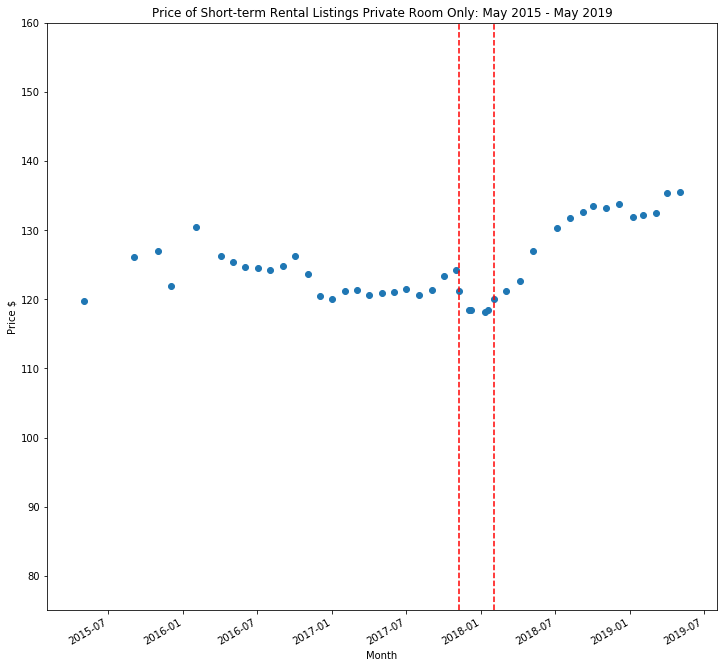

In [122]:
chart_prices(private_room,"Private Room Only",(75,160))


In [123]:
entire_home = listings_t[listings_t['room_type'] == 'Entire home/apt']
entire_home.shape
EH_p = np.asarray(entire_home['price_float'])

EH_1pct = np.percentile(EH_p, 1)
EH_99pct = np.percentile(EH_p, 99)
EH_1pct, EH_99pct

entire_home = entire_home[entire_home['price_float'] <= EH_99pct ]
entire_home = entire_home[entire_home['price_float'] >= EH_1pct ]
entire_home.shape



(165187, 109)

(80.0, 1600.0)

(162173, 109)

C:\Users\ksher\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning:

'file_scraped_dt' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version

C:\Users\ksher\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning:

'file_scraped_dt' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version



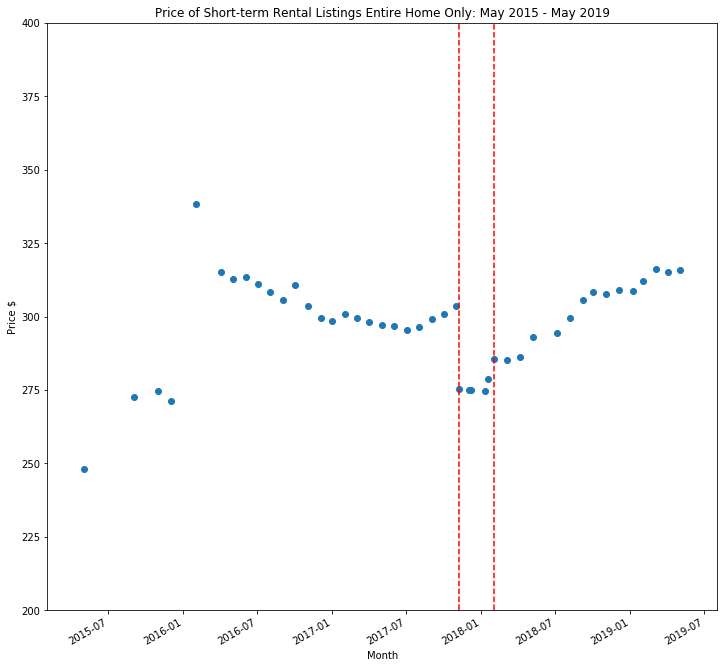

In [124]:
chart_prices(entire_home,"Entire Home Only",(200,400))

In [256]:
PR0 = private_room['2017-11-08']
p0= np.asarray(PR0['price_float'])

PR1 = private_room['2017-11-01']
p1 = np.asarray(PR1['price_float'])


trace1 = go.Histogram(
    x=p1,
    opacity=0.75,
    
    name = 'Private Room on Nov-01-2017'
)
trace2 = go.Histogram(
    x=p0,
    opacity=0.75,
    
    name = 'Private Room on Nov-08-2017'
)


data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Private Room Listings <br> Nov-01-2017 vs Nov-08-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),
                  
                  
                  )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)



In [255]:
PR1 = private_room['2017-11-08']
p1= np.asarray(PR1['price_float'])

PR2 = private_room['2016-11-02']
p2= np.asarray(PR2['price_float'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Private Room on Nov-02-2016'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Private Room on Nov-08-2017'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Private Room Listings <br> Nov-08-2017 vs Nov-02-2016',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),
                  
                  
                  )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)



In [254]:
PR1 = private_room['2018-01-10']
p1= np.asarray(PR1['price_float'])

PR2 = private_room['2017-01-01']
p2= np.asarray(PR2['price_float'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Private Room on Jan-01-2017'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Private Room on Jan-01-2018'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Private Room Listings <br> Jan-01-2018 vs Jan-01-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),
                  
                  
                  )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)


In [128]:
PR1 = private_room['2018-02-02']
p1= np.asarray(PR1['price_float'])

PR2 = private_room['2017-02-02']
p2= np.asarray(PR2['price_float'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Private Room on Feb-02-2017'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Private Room on Feb-02-2018'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Private Room Listings <br> Feb-02-2018 vs Feb-02-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),
                  
                  
                  )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)


In [174]:
PR1 = entire_home['2018-02-02']
p1= np.asarray(PR1['price_float'])

PR2 = entire_home['2017-02-02']
p2= np.asarray(PR2['price_float'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Entire Home/Apartment on Feb-02-2017'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Entire Home/Apartment on Feb-02-2018'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Entire Home Listings <br> Feb-02-2018 vs Feb-02-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),
                  
                  
                  )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)




In [195]:
Feb2018 = private_room['2018-02-02']

del Feb2018['file_scraped_dt']
Feb2018.reset_index()

p_Feb2018 = Feb2018.groupby('id')['price_float'].mean().reset_index()
p_Feb2018.columns=['id', 'price_Feb2018']


Feb2017 = private_room['2017-02-02']

del Feb2017['file_scraped_dt']
Feb2017.reset_index()

p_Feb2017 = Feb2017.groupby('id')['price_float'].mean().reset_index()
p_Feb2017.columns=['id', 'price_Feb2017']

PR_feb_merged = p_Feb2017.merge(p_Feb2018, on = 'id', how = 'inner')
PR_feb_merged.shape




,file_scraped_dt,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_decimal,price_float
0,2018-02-02,8014,https://www.airbnb.com/rooms/8014,20180202120440,2018-02-02,Newly Remodeled room in big house WIFI market,Freshly painted newly done laminate floor with...,The room is recently painted in the color of c...,Freshly painted newly done laminate floor with...,none,...,moderate,f,f,3,NaN,NaN,NaN,1.10,60.00,60.0
1,2018-02-02,8739,https://www.airbnb.com/rooms/8739,20180202120440,2018-02-02,"Mission Sunshine, with Private Bath","Welcome to San Francisco's Mission District, t...","Your sunny room has a queen size bed, and look...","Welcome to San Francisco's Mission District, t...",none,...,moderate,f,f,2,NaN,NaN,NaN,5.32,139.00,139.0
2,2018-02-02,9225,https://www.airbnb.com/rooms/9225,20180202120440,2018-02-02,Artful Potrero Separate Floor with Garden,A Unique Guest Suite! A Spacious Art Filled ...,"It is unique, very spacious [800 sq. ft. with...",A Unique Guest Suite! A Spacious Art Filled ...,none,...,strict,f,f,1,NaN,NaN,NaN,3.82,135.00,135.0
3,2018-02-02,12522,https://www.airbnb.com/rooms/12522,20180202120440,2018-02-02,Perfectly located Castro,1895 Victorian flat w/ 12 ft ceilings. (No Lon...,We live in an 1895 Victorian top flat with 12 ...,1895 Victorian flat w/ 12 ft ceilings. (No Lon...,none,...,strict,f,f,1,NaN,NaN,NaN,3.56,79.00,79.0
4,2018-02-02,18904,https://www.airbnb.com/rooms/18904,20180202120440,2018-02-02,Tranquil Lower Haight w/pvt bath,Welcome to the Lower Haight! My neighborhood a...,Located in one of San Francisco’s most bohemia...,Welcome to the Lower Haight! My neighborhood a...,none,...,moderate,t,t,2,NaN,NaN,NaN,3.94,110.00,110.0
5,2018-02-02,19040,https://www.airbnb.com/rooms/19040,20180202120440,2018-02-02,Mission Garden Retreat,"Mission Garden Retreat is a secluded, courtyar...","An Urban Retreat This modern, urban suite comb...","Mission Garden Retreat is a secluded, courtyar...",none,...,strict,f,f,1,NaN,NaN,NaN,2.23,188.00,188.0
6,2018-02-02,23611,https://www.airbnb.com/rooms/23611,20180202120440,2018-02-02,Bernal Heights Gem with Fab Views !,This listing is for a very cozy & comfortable ...,I am a San Francisco CERTIFIED Short-Term Rent...,This listing is for a very cozy & comfortable ...,none,...,strict,t,t,2,NaN,NaN,NaN,2.13,95.00,95.0
7,2018-02-02,24463,https://www.airbnb.com/rooms/24463,20180202120440,2018-02-02,"Potrero Hill ""Nest"" Quiet, Comfy & Convenient","Comfortable, quiet guest room with own private...","Sunny, quiet private bedroom with own private ...","Comfortable, quiet guest room with own private...",none,...,strict,t,t,2,NaN,NaN,NaN,2.46,155.00,155.0
8,2018-02-02,24685,https://www.airbnb.com/rooms/24685,20180202120440,2018-02-02,Castro/Haight San Francisco,NaN,Offering private bed plus living room area. R...,Offering private bed plus living room area. R...,none,...,flexible,f,f,1,NaN,NaN,NaN,1.62,79.00,79.0
9,2018-02-02,25094,https://www.airbnb.com/rooms/25094,20180202120440,2018-02-02,San Francisco's Luxury Oasis On Noe,When people visit our home they never want to ...,Beautiful private room in a lovely Upper Noe V...,When people visit our home they never want to ...,none,...,flexible,f,f,1,NaN,NaN,NaN,0.56,150.00,150.0


,file_scraped_dt,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_decimal,price_float
0,2017-02-02,15285867,https://www.airbnb.com/rooms/15285867,20170202135808,2017-02-02,Cozy Rendezvous,"Cozy, sunny single occupancy bedroom in a spac...",NaN,"Cozy, sunny single occupancy bedroom in a spac...",none,...,flexible,f,f,2,NaN,NaN,NaN,1.74,98.00,98.0
1,2017-02-02,6938818,https://www.airbnb.com/rooms/6938818,20170202135808,2017-02-02,Best Secret in Town,My two story house is located in the quite sid...,The room is spacious and it is on the top leve...,My two story house is located in the quite sid...,none,...,strict,f,f,3,NaN,NaN,NaN,2.10,107.00,107.0
2,2017-02-02,16362304,https://www.airbnb.com/rooms/16362304,20170202135808,2017-02-02,Best Master Suite in Town,"My place is close to Golden Gate Bridge, Lands...",This is a two story house. Your room is on the...,"My place is close to Golden Gate Bridge, Lands...",none,...,strict,f,f,3,NaN,NaN,NaN,2.00,85.00,85.0
3,2017-02-02,8411606,https://www.airbnb.com/rooms/8411606,20170202135808,2017-02-02,comfy oceanside nest,Private room on top level of house with city a...,The room is +250 square feet of warmth and lig...,Private room on top level of house with city a...,none,...,moderate,f,f,1,NaN,NaN,NaN,3.77,105.00,105.0
4,2017-02-02,3821592,https://www.airbnb.com/rooms/3821592,20170202135808,2017-02-02,Quiet Room with Ocean Views Townhouse,Ocean Beach home with unobstructed west-facing...,Our townhouse has an unobstructed panoramic vi...,Ocean Beach home with unobstructed west-facing...,none,...,flexible,f,f,1,NaN,NaN,NaN,0.10,96.00,96.0
5,2017-02-02,14652409,https://www.airbnb.com/rooms/14652409,20170202135808,2017-02-02,Garden of Eden,"You'll love the prime location, near the Golde...",What makes my home unique is the location. I a...,"You'll love the prime location, near the Golde...",none,...,flexible,f,f,2,NaN,NaN,NaN,0.51,148.00,148.0
6,2017-02-02,3439823,https://www.airbnb.com/rooms/3439823,20170202135808,2017-02-02,Private Room with Comfy Queen Bed in Central SF,This apartment new to Airbnb is perfectly loca...,Our apartment is in the heart of the city. It'...,This apartment new to Airbnb is perfectly loca...,none,...,flexible,f,f,1,NaN,NaN,NaN,NaN,150.00,150.0
7,2017-02-02,1605483,https://www.airbnb.com/rooms/1605483,20170202135808,2017-02-02,"Cozy Blue Room: Haight, Central SF!",Come home to color! Enjoy your cozy blue BR i...,You won't lack for space -- you'll have rooms ...,Come home to color! Enjoy your cozy blue BR i...,none,...,moderate,f,f,1,NaN,NaN,NaN,1.89,89.00,89.0
8,2017-02-02,13745138,https://www.airbnb.com/rooms/13745138,20170202135808,2017-02-02,"Beautiful, spacious Alamo Square/NoPa apartment","This spacious, conveniently located apartment ...",NaN,"This spacious, conveniently located apartment ...",none,...,flexible,f,f,1,NaN,NaN,NaN,NaN,95.00,95.0
9,2017-02-02,8142,https://www.airbnb.com/rooms/8142,20170202135808,2017-02-02,Friendly Hotel Apartment Style,NaN,Weekly rental Sunny view Rm/Wi-Fi/TV/sink/larg...,Weekly rental Sunny view Rm/Wi-Fi/TV/sink/larg...,none,...,strict,f,f,7,NaN,NaN,NaN,0.20,65.00,65.0


(830, 3)

In [196]:
p1= np.asarray(PR_feb_merged['price_Feb2017'])


p2= np.asarray(PR_feb_merged['price_Feb2018'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Private Room on Feb-02-2017'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Private Room on Feb-02-2018'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Common Private Room Listings <br> Feb-02-2018 vs Feb-02-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),


              )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)


In [197]:
Feb2018 = entire_home['2018-02-02']

del Feb2018['file_scraped_dt']
Feb2018.reset_index()

p_Feb2018 = Feb2018.groupby('id')['price_float'].mean().reset_index()
p_Feb2018.columns=['id', 'price_Feb2018']


Feb2017 = entire_home['2017-02-02']

del Feb2017['file_scraped_dt']
Feb2017.reset_index()

p_Feb2017 = Feb2017.groupby('id')['price_float'].mean().reset_index()
p_Feb2017.columns=['id', 'price_Feb2017']

EH_feb_merged = p_Feb2017.merge(p_Feb2018, on = 'id', how = 'inner')
EH_feb_merged.shape



,file_scraped_dt,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_decimal,price_float
0,2018-02-02,958,https://www.airbnb.com/rooms/958,20180202120440,2018-02-02,"Bright, Modern Garden Unit - 1BR/1B",Our bright garden unit overlooks a grassy back...,"Newly remodeled, modern, and bright garden uni...",Our bright garden unit overlooks a grassy back...,none,...,moderate,f,f,1,NaN,NaN,NaN,1.20,170.00,170.0
1,2018-02-02,8339,https://www.airbnb.com/rooms/8339,20180202120440,2018-02-02,Historic Alamo Square Victorian,Pls email before booking. Interior featured i...,Please send us a quick message before booking ...,Pls email before booking. Interior featured i...,none,...,strict,t,t,2,NaN,NaN,NaN,0.26,575.00,575.0
2,2018-02-02,8567,https://www.airbnb.com/rooms/8567,20180202120440,2018-02-02,Lovely 2BR flat Great Location,NaN,"Fully furnished 2BR, 1BA flat in beautiful Vic...","Fully furnished 2BR, 1BA flat in beautiful Vic...",none,...,moderate,f,f,1,NaN,NaN,NaN,0.26,255.00,255.0
3,2018-02-02,10251,https://www.airbnb.com/rooms/10251,20180202120440,2018-02-02,Victorian Suite in Inner Mission,NaN,Please read this before you book! Second floor...,Please read this before you book! Second floor...,none,...,moderate,f,f,1,NaN,NaN,NaN,2.65,240.00,240.0
4,2018-02-02,14125,https://www.airbnb.com/rooms/14125,20180202120440,2018-02-02,Gallery Residence,Luna Rienne Gallery is very pleased to offer o...,Luna Rienne Gallery is very pleased to offer o...,Luna Rienne Gallery is very pleased to offer o...,none,...,moderate,f,f,1,NaN,NaN,NaN,0.83,215.00,215.0
5,2018-02-02,23540,https://www.airbnb.com/rooms/23540,20180202120440,2018-02-02,Modern in-Law Unit in the Happening,Recently built fully furnished two-story 2BR i...,"Fully furnished 2BR in-law apartment, built ad...",Recently built fully furnished two-story 2BR i...,none,...,moderate,f,f,1,NaN,NaN,NaN,0.74,225.00,225.0
6,2018-02-02,23630,https://www.airbnb.com/rooms/23630,20180202120440,2018-02-02,Castro Guest Suite With Continental Breakfast,"A perfect hotel alternative, our fully furnish...",Located on the lower level of the owners' attr...,"A perfect hotel alternative, our fully furnish...",none,...,strict,f,t,1,NaN,NaN,NaN,3.23,155.00,155.0
7,2018-02-02,24723,https://www.airbnb.com/rooms/24723,20180202120440,2018-02-02,Apartment-like rooms in PacHeights,This one-bedroom space comes with a large bedr...,This one-bedroom space comes with a large bedr...,This one-bedroom space comes with a large bedr...,none,...,moderate,f,f,2,NaN,NaN,NaN,2.32,195.00,195.0
8,2018-02-02,27028,https://www.airbnb.com/rooms/27028,20180202120440,2018-02-02,Secret Mission Garden,"Enjoy a picnic in Dolores Park, or the world-c...","Your deluxe master suite has warm, wood-panele...","Enjoy a picnic in Dolores Park, or the world-c...",none,...,strict,f,f,2,NaN,NaN,NaN,0.60,199.00,199.0
9,2018-02-02,32802,https://www.airbnb.com/rooms/32802,20180202120440,2018-02-02,Garden Flat in Telegraph Hill,"Unique apartment, fully furnished, on the grou...",Bedroom: - queen-size bed in the main room (S...,"Unique apartment, fully furnished, on the grou...",none,...,strict,f,f,1,NaN,NaN,NaN,0.29,195.00,195.0


,file_scraped_dt,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price_decimal,price_float
0,2017-02-02,2134100,https://www.airbnb.com/rooms/2134100,20170202135808,2017-02-02,Ocean Beach hilltop cottage,Newly built cottage that comfortably sleeps 2....,Amazing ocean views with a private brand new b...,Newly built cottage that comfortably sleeps 2....,none,...,moderate,f,f,1,NaN,NaN,NaN,6.47,135.00,135.0
1,2017-02-02,11187767,https://www.airbnb.com/rooms/11187767,20170202135808,2017-02-02,Huge Seacliff Penthouse With Views,Amazing views from this immense 3 bedroom/ 2 b...,"Spacious patio deck, library with over 300 mov...",Amazing views from this immense 3 bedroom/ 2 b...,none,...,strict,f,f,1,NaN,NaN,NaN,0.57,370.00,370.0
2,2017-02-02,16691183,https://www.airbnb.com/rooms/16691183,20170202135808,2017-02-02,Classic SF House with Parking near GG Bridge!,Classic San Francisco house with gorgeous hard...,NaN,Classic San Francisco house with gorgeous hard...,none,...,strict,f,f,1,NaN,NaN,NaN,2.00,250.00,250.0
3,2017-02-02,7856443,https://www.airbnb.com/rooms/7856443,20170202135808,2017-02-02,The Real San Francisco #2,"Minutes to GG Bridge, GG Park, Museums, The Pr...",Are we not available for your dates? Check av...,"Minutes to GG Bridge, GG Park, Museums, The Pr...",none,...,strict,f,f,2,NaN,NaN,NaN,2.27,195.00,195.0
4,2017-02-02,14299442,https://www.airbnb.com/rooms/14299442,20170202135808,2017-02-02,Americana arty 3-room private apartment w/kitchen,"I'm 1/2 block from downtown transportation, ne...",NaN,"I'm 1/2 block from downtown transportation, ne...",none,...,flexible,f,f,1,NaN,NaN,NaN,0.67,140.00,140.0
5,2017-02-02,15054887,https://www.airbnb.com/rooms/15054887,20170202135808,2017-02-02,BEAUTIFUL PENTHOUSE APT - 3 BLOCKS TO BAKERS B...,Beautiful penthouse apartment in the Richmond/...,This is a very bright spacious penthouse locat...,Beautiful penthouse apartment in the Richmond/...,none,...,strict,f,f,1,NaN,NaN,NaN,3.75,200.00,200.0
6,2017-02-02,5548977,https://www.airbnb.com/rooms/5548977,20170202135808,2017-02-02,The Real San Francisco,"Minutes to GG Bridge, GG Park, Museums, The Pr...","**Please note, smoking is strictly prohibited ...","Minutes to GG Bridge, GG Park, Museums, The Pr...",none,...,strict,f,f,2,NaN,NaN,NaN,5.26,195.00,195.0
7,2017-02-02,16064495,https://www.airbnb.com/rooms/16064495,20170202135808,2017-02-02,Charming house with view of Golden Gate Bridge,Welcome to one of the coziest and charming hom...,This house has lots of history! It was origina...,Welcome to one of the coziest and charming hom...,none,...,strict,f,f,1,NaN,NaN,NaN,NaN,244.00,244.0
8,2017-02-02,4688930,https://www.airbnb.com/rooms/4688930,20170202135808,2017-02-02,Modern remodel + period charm,A view of the Golden Gate Bridge across Lincol...,Remodeled 1 bedroom + nursery + optional attic...,A view of the Golden Gate Bridge across Lincol...,none,...,moderate,f,f,1,NaN,NaN,NaN,0.10,300.00,300.0
9,2017-02-02,8388658,https://www.airbnb.com/rooms/8388658,20170202135808,2017-02-02,Mid-century Seacliff near GG Bridge,Three-bedroom in exclusive Seacliff neighborho...,NaN,Three-bedroom in exclusive Seacliff neighborho...,none,...,flexible,f,f,1,NaN,NaN,NaN,NaN,895.00,895.0


(1348, 3)

In [200]:
p1= np.asarray(EH_feb_merged['price_Feb2017'])


p2= np.asarray(EH_feb_merged['price_Feb2018'])


trace1 = go.Histogram(
    x=p2,
    opacity=0.75,
    name = 'Entire Home/Apartment on Feb-02-2017'
)
trace2 = go.Histogram(
    x=p1,
    opacity=0.75,
    name = 'Entire Home/Apartment on Feb-02-2018'
)



data = [trace1, trace2]
layout = go.Layout(barmode='overlay',
        title='Distribution of the Price of Common Entire Home Listings <br> Feb-02-2018 vs Feb-02-2017',
    xaxis=dict(
        title='Price $'
    ),
    yaxis=dict(
        title='Number of Listings'
    ),


              )
fig = go.Figure(data=data, layout=layout)

plotly.offline.iplot(fig)


In [249]:
sample_1 = np.asarray(PR_feb_merged['price_Feb2017'])
sample_2 = np.asarray(PR_feb_merged['price_Feb2018'])

In [250]:
def t_test(sample_1, sample_2):
    
    def welch_test_statistic(sample_1, sample_2):
        numerator = np.mean(sample_1) - np.mean(sample_2)
        denominator_sq = (np.var(sample_1) / len(sample_1)) + (np.var(sample_2) / len(sample_2))
        return numerator / np.sqrt(denominator_sq)

    stat =  welch_test_statistic(sample_1, sample_2)  
    print(stat)

    def welch_satterhwaithe_df(sample_1, sample_2):
        ss1 = len(sample_1)
        ss2 = len(sample_2)
        df = (
            ((np.var(sample_1)/ss1 + np.var(sample_2)/ss2)**(2.0)) / 
            ((np.var(sample_1)/ss1)**(2.0)/(ss1 - 1) + (np.var(sample_2)/ss2)**(2.0)/(ss2 - 1))
        )
        return df

    df = welch_satterhwaithe_df(sample_1, sample_2)
    
    x = np.linspace(-3, 3, num=250)

    fig, ax = plt.subplots(1, figsize=(16, 3))
    students = stats.t(df)
    ax.plot(x, students.pdf(x), linewidth=2, label="Degree of Freedom: {:2.2f}".format(df))
    ax.legend()
    ax.set_title("Distribution of Welsh's Test Statistic Under the Null Hypothesis")


    x = np.linspace(-3, 3, num=250)

    fig, ax = plt.subplots(1, figsize=(16, 3))
    students = stats.t(df)
    ax.plot(x, students.pdf(x), linewidth=2, label="Degree of Freedom: {:2.2f}".format(df))
    _ = ax.fill_between(x, students.pdf(x), where=(x >= -1 * stat), color="red", alpha=0.25)
    _ = ax.fill_between(x, students.pdf(x), where=(x <= stat), color="red", alpha=0.25)
    ax.legend()
    ax.set_title("p-value Reigon")

    p_value = students.cdf(stat) + (1 - students.cdf(-stat))
    print("p-value for different price: {:2.2f}".format(p_value))

-0.21827966035242524
p-value for different price: 0.83


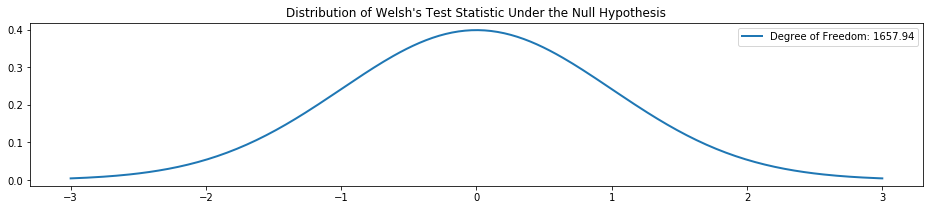

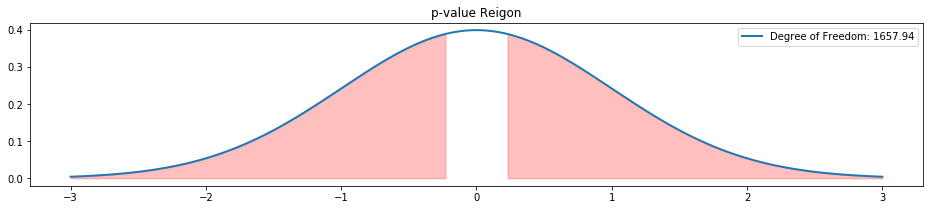

In [251]:
t_test(sample_1, sample_2)

-1.0464849841793147
p-value for different price: 0.30


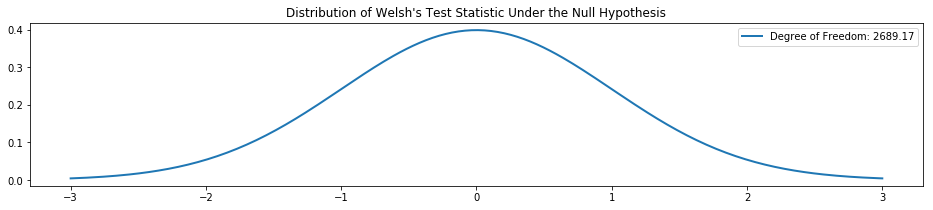

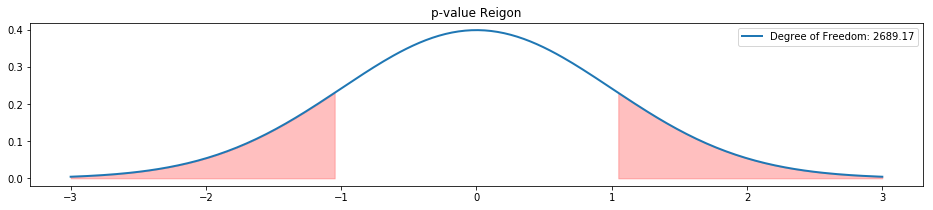

In [252]:
sample_1 = np.asarray(EH_feb_merged['price_Feb2017'])
sample_2 = np.asarray(EH_feb_merged['price_Feb2018'])

t_test(sample_1, sample_2)

In [232]:
# test_statistic = welch_test_statistic(sample_1, sample_2)

# p_value = 1 - students.cdf(stat)
# p_value

In [225]:
EH_feb_merged

,id,price_Feb2017,price_Feb2018
0,958,170.0,170.0
1,8339,550.0,575.0
2,8567,255.0,255.0
3,10251,240.0,240.0
4,14125,215.0,215.0
5,23540,225.0,225.0
6,23630,165.0,155.0
7,24723,170.0,195.0
8,32802,195.0,195.0
9,33577,200.0,220.0


,id,price_Feb2017,price_Feb2018
0,8739,149.0,139.0
1,12522,79.0,79.0
2,18904,110.0,110.0
3,19040,188.0,188.0
4,24463,144.0,155.0
5,24685,79.0,79.0
6,25094,150.0,150.0
7,25463,115.0,110.0
8,25662,125.0,125.0
9,25927,110.0,110.0
